# Import libs

In [1]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [2]:
import collections
import matplotlib.pyplot as plt

import numpy as np
import torch
import torch.optim as optim
from torchvision.transforms import Compose, ToTensor, Normalize, ToPILImage, Resize
from tqdm import tqdm

# Import RetinaNet architecture

In [3]:
!pip install gdown pycocotools

In [4]:
#!rm -r GSN

In [5]:
!gdown https://drive.google.com/uc?id=1JVwgJeXSkcgoEDEuMDaG5HTFvqu7cerZ

Traceback (most recent call last):
  File "C:\Users\YuriMomo\anaconda3\envs\py310\lib\runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "C:\Users\YuriMomo\anaconda3\envs\py310\lib\runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "C:\Users\YuriMomo\anaconda3\envs\py310\Scripts\gdown.exe\__main__.py", line 7, in <module>
  File "C:\Users\YuriMomo\anaconda3\envs\py310\lib\site-packages\gdown\cli.py", line 156, in main
    filename = download(
  File "C:\Users\YuriMomo\anaconda3\envs\py310\lib\site-packages\gdown\download.py", line 259, in download
    filename_from_url = m.groups()[0]
AttributeError: 'NoneType' object has no attribute 'groups'


In [6]:
#!unzip -q GSN.zip

In [7]:
from GSN.WiderDataLoader.wider_loader import WiderFaceDataset
from GSN.WiderDataLoader.wider_batch_iterator import BatchIterator
from GSN.model.RetinaNet import RetinaNet, evaluate
from GSN.model.Utils import show_image, draw_loss

# Test device

In [8]:
!nvidia-smi

Fri Jan 12 17:47:13 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.33                 Driver Version: 546.33       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 2060      WDDM  | 00000000:26:00.0  On |                  N/A |
|  0%   41C    P8              13W / 184W |   1336MiB / 12288MiB |     22%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Prepare data

## Set variables

In [10]:
DATA_DIR = 'WIDER'
NUM_CLASSES = 1
BATCH_SIZE = 20
LEARNING_RATE = 2e-5
EPOCHS_NUM = 15

## Download dataset

In [11]:
#!rm -r WIDER
#!gdown "1jDU6gTyKwWDZL0YRuKhxz69rmjVJmVRW"

In [12]:
#!unzip -q WIDER.zip

In [13]:
transform = Compose([ToPILImage(), Resize((512, 800)), ToTensor(),Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

In [14]:
wider_train_dataset = WiderFaceDataset(DATA_DIR, split='train', transform=transform, augment=False)
wider_val_dataset = WiderFaceDataset(DATA_DIR, split='val', transform=transform, augment=False)
wider_test_dataset = WiderFaceDataset(DATA_DIR, split='test', transform=transform, augment=False)

train_data = BatchIterator(wider_train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_data = BatchIterator(wider_val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_data = BatchIterator(wider_test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


## Prepare drive to save model

To save model weights on google drive

In [15]:
#from google.colab import drive
#drive.mount('/content/gdrive')

In [16]:
#drive_path = '/content/'
#drive_path = '/content/gdrive/MyDrive/Colab Notebooks/GSN_PROJ_FILES/RetinaNet_weights/'
drive_path = 'RetinaNet_weights/'

# Model

## Init

### Init new model

In [17]:
model = RetinaNet().to(device)

### Download and init pretrain model

In [18]:
# !gdown  10JQgb01MsceilLNixz1abdkpZzl4sht3 # pretrained on 20 epochs

In [19]:
saved_weights = torch.load('model_59.pth', map_location=device)
model.load_state_dict(saved_weights)

<All keys matched successfully>

### Init optimizer

In [20]:
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.8)

## Train

In [21]:
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      | 285845 KiB | 285845 KiB | 285845 KiB |      0 B   |\n|       from large pool | 246272 KiB | 246272 KiB | 246272 KiB |      0 B   |\n|       from small pool |  39573 KiB |  39573 KiB |  39573 KiB |      0 B   |\n|---------------------------------------------------------------------------|\n| Active memory         | 285845 KiB | 285845 KiB | 285845 KiB |      0 B   |\n|       from large pool | 246272 KiB | 246272 KiB |

In [22]:
loss_hist = collections.deque(maxlen=500)
regr_hist = collections.deque(maxlen=500)
clas_hist = collections.deque(maxlen=500)
loss_val_hist = collections.deque(maxlen=500)
regr_val_hist = collections.deque(maxlen=500)
clas_val_hist = collections.deque(maxlen=500)
best_valid_loss = float('Inf')

for epoch_num in range(EPOCHS_NUM):
    epoch_loss = []
    regr_loss = []
    clas_loss = []

    model.train()
    for iter_num, data in enumerate(tqdm(train_data, desc=f'Epoch {epoch_num}')):
        optimizer.zero_grad()

        if torch.cuda.is_available():
            classification_loss, regression_loss = model([data['img'].cuda().float(), data['boxes_list'].cuda()])
        else:
            classification_loss, regression_loss = model([data['img'].float(), data['boxes_list']])
        loss = classification_loss + regression_loss
        if loss == 0:
            continue
        epoch_loss.append(float(loss))
        regr_loss.append(float(regression_loss))
        clas_loss.append(float(classification_loss))
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.1)
        optimizer.step()


    average_loss = np.mean(epoch_loss)
    average_clas_loss = np.mean(clas_loss)
    average_regr_loss = np.mean(regr_loss)
    loss_hist.append(average_loss)
    regr_hist.append(average_regr_loss)
    clas_hist.append(average_clas_loss)
    print(f'Epoch: {epoch_num}/{EPOCHS_NUM} | Average Loss: {average_loss} | Classification loss: {float(average_clas_loss):1.5f} | Regression loss: {float(average_regr_loss):1.5f}')
    scheduler.step()

    epoch_loss = []
    regr_loss = []
    clas_loss = []
    for iter_num, data in enumerate(val_data):
        if torch.cuda.is_available():
            classification_loss, regression_loss = model([data['img'].cuda().float(), data['boxes_list'].cuda()])
        else:
            classification_loss, regression_loss = model([data['img'].float(), data['boxes_list']])
        loss = classification_loss + regression_loss
        if bool(loss == 0):
            continue
        epoch_loss.append(float(loss))
        regr_loss.append(float(regression_loss))
        clas_loss.append(float(classification_loss))
    average_loss = np.mean(epoch_loss)
    average_clas_loss = np.mean(clas_loss)
    average_regr_loss = np.mean(regr_loss)
    loss_val_hist.append(average_loss)
    regr_val_hist.append(average_regr_loss)
    clas_val_hist.append(average_clas_loss)
    print(
        f'Evaluate | Average Loss: {average_loss} | Classification loss: {float(average_clas_loss):1.5f} | Regression loss: {float(average_regr_loss):1.5f}')


    if epoch_num % 4 == 0:
      try:
          model.eval()
          evaluate(dataset=wider_val_dataset, model=model, threshold=0.05)
      except Exception as e:
          print(f"Error: {e}")

    if epoch_num > EPOCHS_NUM-10 and best_valid_loss > average_loss:
        best_valid_loss = average_loss
        filename = f'model_{epoch_num}.pth'
        print("Saved model!")
        torch.save(model.state_dict(), drive_path + "training/" + filename)
    if epoch_num+1 % 20 == 0:
        filename = f'model_{epoch_num}.pth'
        print("Saved model!")
        torch.save(model.state_dict(), drive_path + "training/" + filename)

Epoch 0: 184it [03:51,  1.26s/it]                                                                                      


Epoch: 0/15 | Average Loss: 0.38036073873872345 | Classification loss: 0.09511 | Regression loss: 0.28525
Evaluate | Average Loss: 1.0001714644224748 | Classification loss: 0.41252 | Regression loss: 0.58766
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=4.41s).
Accumulating evaluation results...
DONE (t=0.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.207
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.480
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.134
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.120
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.406
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.402
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 

Epoch 1: 184it [04:01,  1.31s/it]                                                                                      


Epoch: 1/15 | Average Loss: 0.38634754895516066 | Classification loss: 0.09674 | Regression loss: 0.28960
Evaluate | Average Loss: 0.9770235328570657 | Classification loss: 0.38840 | Regression loss: 0.58862


Epoch 2: 184it [04:27,  1.45s/it]                                                                                      


Epoch: 2/15 | Average Loss: 0.37181089980446774 | Classification loss: 0.09210 | Regression loss: 0.27971
Evaluate | Average Loss: 0.9801791595376056 | Classification loss: 0.39010 | Regression loss: 0.59008


Epoch 3: 184it [04:42,  1.54s/it]                                                                                      


Epoch: 3/15 | Average Loss: 0.36265233248148276 | Classification loss: 0.08682 | Regression loss: 0.27583
Evaluate | Average Loss: 0.9688321287217347 | Classification loss: 0.37634 | Regression loss: 0.59250


Epoch 4: 184it [04:12,  1.37s/it]                                                                                      


Epoch: 4/15 | Average Loss: 0.35926796908935776 | Classification loss: 0.08625 | Regression loss: 0.27302
Evaluate | Average Loss: 0.9715418388014254 | Classification loss: 0.38626 | Regression loss: 0.58528
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.19s).
Accumulating evaluation results...
DONE (t=0.14s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.206
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.475
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.134
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.118
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.404
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 

Epoch 5: 184it [04:07,  1.35s/it]                                                                                      


Epoch: 5/15 | Average Loss: 0.35431139916181564 | Classification loss: 0.08265 | Regression loss: 0.27166
Evaluate | Average Loss: 0.9807148005651392 | Classification loss: 0.39743 | Regression loss: 0.58328


Epoch 6: 184it [03:59,  1.30s/it]                                                                                      


Epoch: 6/15 | Average Loss: 0.3454606579211743 | Classification loss: 0.08089 | Regression loss: 0.26457
Evaluate | Average Loss: 0.9682647469251052 | Classification loss: 0.38672 | Regression loss: 0.58155
Saved model!


Epoch 7: 184it [04:28,  1.46s/it]                                                                                      


Epoch: 7/15 | Average Loss: 0.34000293691845046 | Classification loss: 0.07845 | Regression loss: 0.26155
Evaluate | Average Loss: 0.9870133037152498 | Classification loss: 0.39985 | Regression loss: 0.58717


Epoch 8: 184it [04:03,  1.32s/it]                                                                                      


Epoch: 8/15 | Average Loss: 0.33138382912653946 | Classification loss: 0.07574 | Regression loss: 0.25565
Evaluate | Average Loss: 0.9789053253505541 | Classification loss: 0.39619 | Regression loss: 0.58272
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.83s).
Accumulating evaluation results...
DONE (t=0.17s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.211
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.479
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.143
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.122
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.412
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.420
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 

Epoch 9: 184it [03:59,  1.30s/it]                                                                                      


Epoch: 9/15 | Average Loss: 0.3291062476194423 | Classification loss: 0.07538 | Regression loss: 0.25372
Evaluate | Average Loss: 0.9842367301816526 | Classification loss: 0.40251 | Regression loss: 0.58173


Epoch 10: 184it [03:59,  1.30s/it]                                                                                     


Epoch: 10/15 | Average Loss: 0.32397953113136085 | Classification loss: 0.07383 | Regression loss: 0.25015
Evaluate | Average Loss: 0.9848739180875861 | Classification loss: 0.40222 | Regression loss: 0.58265


Epoch 11: 184it [04:02,  1.32s/it]                                                                                     


Epoch: 11/15 | Average Loss: 0.32178387005368003 | Classification loss: 0.07317 | Regression loss: 0.24861
Evaluate | Average Loss: 0.9836913256541543 | Classification loss: 0.40044 | Regression loss: 0.58325


Epoch 12: 184it [04:03,  1.32s/it]                                                                                     


Epoch: 12/15 | Average Loss: 0.3170624858821216 | Classification loss: 0.07144 | Regression loss: 0.24563
Evaluate | Average Loss: 0.9897676136182703 | Classification loss: 0.40596 | Regression loss: 0.58381
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.47s).
Accumulating evaluation results...
DONE (t=0.16s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.211
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.480
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.136
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.122
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.411
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.422
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 

Epoch 13: 184it [04:01,  1.31s/it]                                                                                     


Epoch: 13/15 | Average Loss: 0.31654730066657066 | Classification loss: 0.07095 | Regression loss: 0.24560
Evaluate | Average Loss: 0.987853300312291 | Classification loss: 0.40443 | Regression loss: 0.58343


Epoch 14: 184it [04:02,  1.32s/it]                                                                                     


Epoch: 14/15 | Average Loss: 0.30971985569466715 | Classification loss: 0.06956 | Regression loss: 0.24016
Evaluate | Average Loss: 0.9883841729682424 | Classification loss: 0.40593 | Regression loss: 0.58245


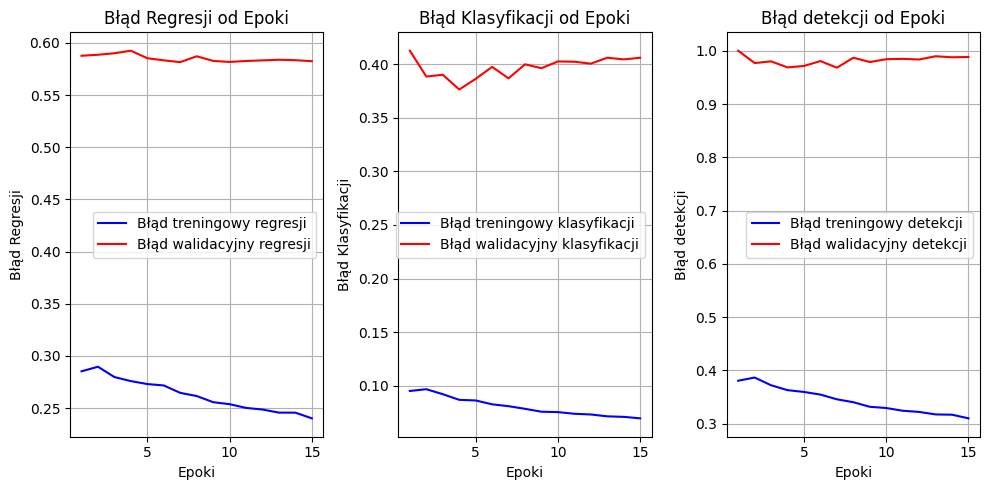

In [23]:
import matplotlib.pyplot as plt

epochs = range(1, len(regr_hist) + 1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.plot(epochs, regr_hist, 'b', label='Błąd treningowy regresji')
plt.plot(epochs, regr_val_hist, 'r', label='Błąd walidacyjny regresji')
plt.title('Błąd Regresji od Epoki')
plt.xlabel('Epoki')
plt.ylabel('Błąd Regresji')
plt.grid()
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs, clas_hist, 'b', label='Błąd treningowy klasyfikacji')
plt.plot(epochs, clas_val_hist, 'r', label='Błąd walidacyjny klasyfikacji')
plt.title('Błąd Klasyfikacji od Epoki')
plt.xlabel('Epoki')
plt.ylabel('Błąd Klasyfikacji')
plt.grid()
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(epochs, loss_hist, 'b', label='Błąd treningowy detekcji')
plt.plot(epochs, loss_val_hist, 'r', label='Błąd walidacyjny detekcji')
plt.title('Błąd detekcji od Epoki')
plt.xlabel('Epoki')
plt.ylabel('Błąd detekcji')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

## Training loss

## Evaluate loaded model

In [24]:
model.eval()
try:
    evaluate(dataset=wider_val_dataset, model=model, threshold=0.1)
except Exception as e:
    print(f"Error: {e}")

creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.48s).
Accumulating evaluation results...
DONE (t=0.14s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.210
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.479
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.137
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.121
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.407
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.423
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.225
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.269
 Average Recall     (AR) @[ IoU=0.5

## Predict boxes in images using a loaded model

In [25]:
print(len(wider_val_dataset))

print(model)

920
RetinaNet(
  (Backbone): ResNet50(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
 

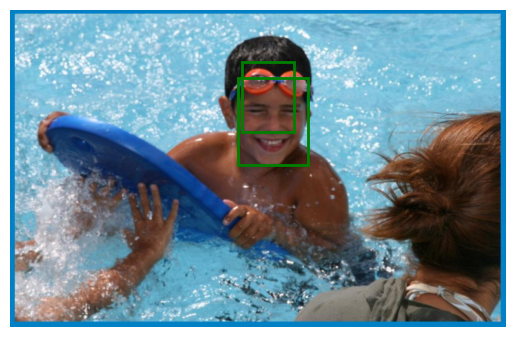

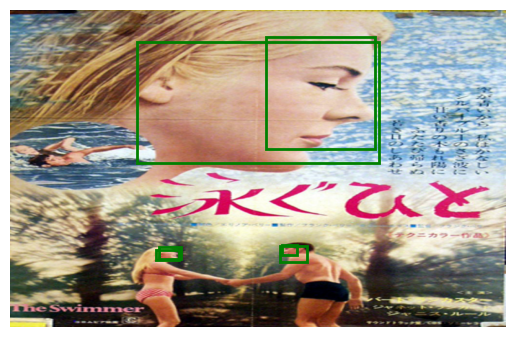

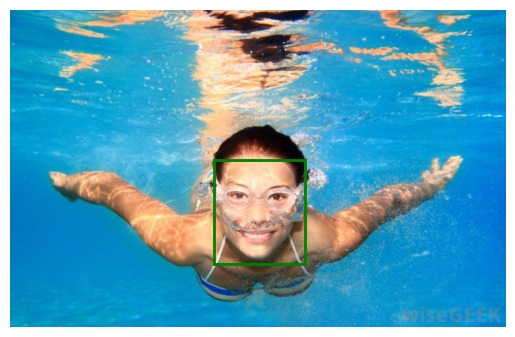

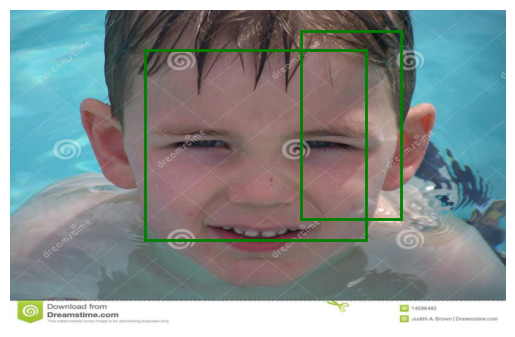

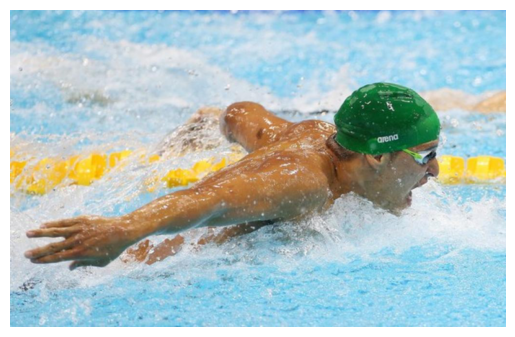

...

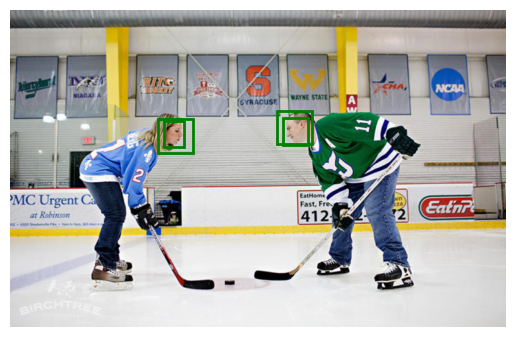

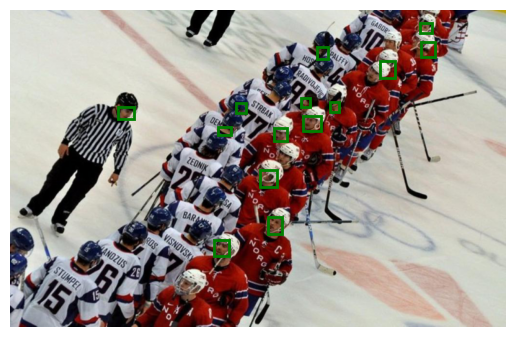

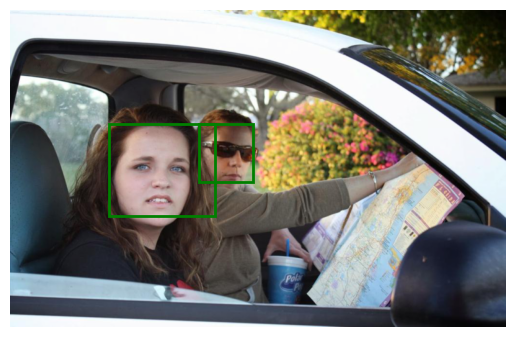

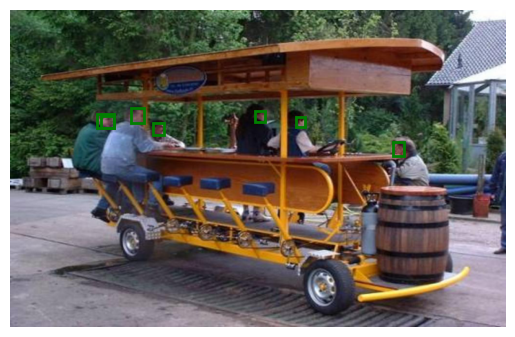

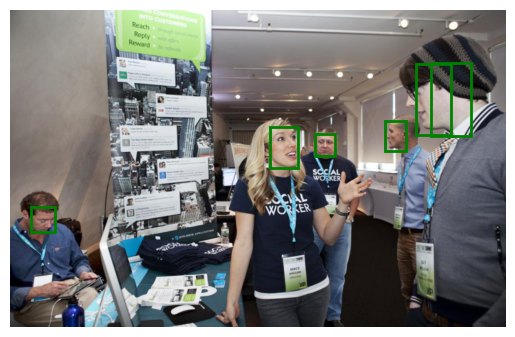

In [26]:
model.set_eval_thresholds(nms_threshold=0.5, score_threshold=0.25)
for i in range(0, len(wider_val_dataset), 20):
    data = wider_val_dataset[i]
    model.eval()
    if torch.cuda.is_available():
        scores, labels, boxes = model([data['img'].cuda().float().unsqueeze(0), data['boxes_list'].cuda().unsqueeze(0)])
    else:
        scores, labels, boxes = model([data['img'].float().unsqueeze(0), data['boxes_list'].unsqueeze(0)])
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    inverse_normalize_transform = Normalize(
        mean=[-m / s for m, s in zip(mean, std)],
        std=[1 / s for s in std]
    )
    image = inverse_normalize_transform(data['img'])

    boxes = boxes.cpu()
    with torch.no_grad():
        show_image(image, boxes)